### Notebook to the identification of infected and bystander cells using a logistic regression classifier 

- **Developed by**: Carlos Talavera-López Ph.D
- **Würzburg Institute for Systems Immunology & Faculty of Medicine, Julius-Maximilian-Universität Würzburg**
- v231212

### Import required modules

In [1]:
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from pywaffle import Waffle
import matplotlib.pyplot as plt

from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import label_binarize
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.9.2
scanpy      1.9.3
-----
PIL                 10.0.0
appnope             0.1.3
asttokens           NA
backcall            0.2.0
colorama            0.4.6
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.7
decorator           5.1.1
executing           1.2.0
h5py                3.9.0
importlib_resources NA
ipykernel           6.25.0
ipywidgets          8.0.7
jedi                0.18.2
joblib              1.3.2
kiwisolver          1.4.4
llvmlite            0.40.1
matplotlib          3.7.2
mpl_toolkits        NA
natsort             8.4.0
numba               0.57.1
numpy               1.24.4
packaging           23.1
pandas              2.0.3
parso               0.8.3
patsy               0.5.3
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources       NA
platformdirs        3.9.1
prompt_toolkit      3.0.39
psutil              5.9.5
ptyprocess          0.7.0
pure_eval           0.2.

### Read in dataset

In [3]:
adata = sc.read_h5ad('../data/Marburg_cell_states_locked_ctl231212.raw.h5ad') 
adata

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status'
    var: 'mt', 'ribo'
    uns: 'cell_states_colors', 'disease_colors', 'group_colors', 'infected_status_colors', 'infection_colors'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

### Identify viral genes and create label for them

In [4]:
viral_genes = [gene for gene in adata.var_names if 'NC_' in gene]
adata.obs['viral_counts'] = np.sum(adata[:, viral_genes].X, axis = 1)

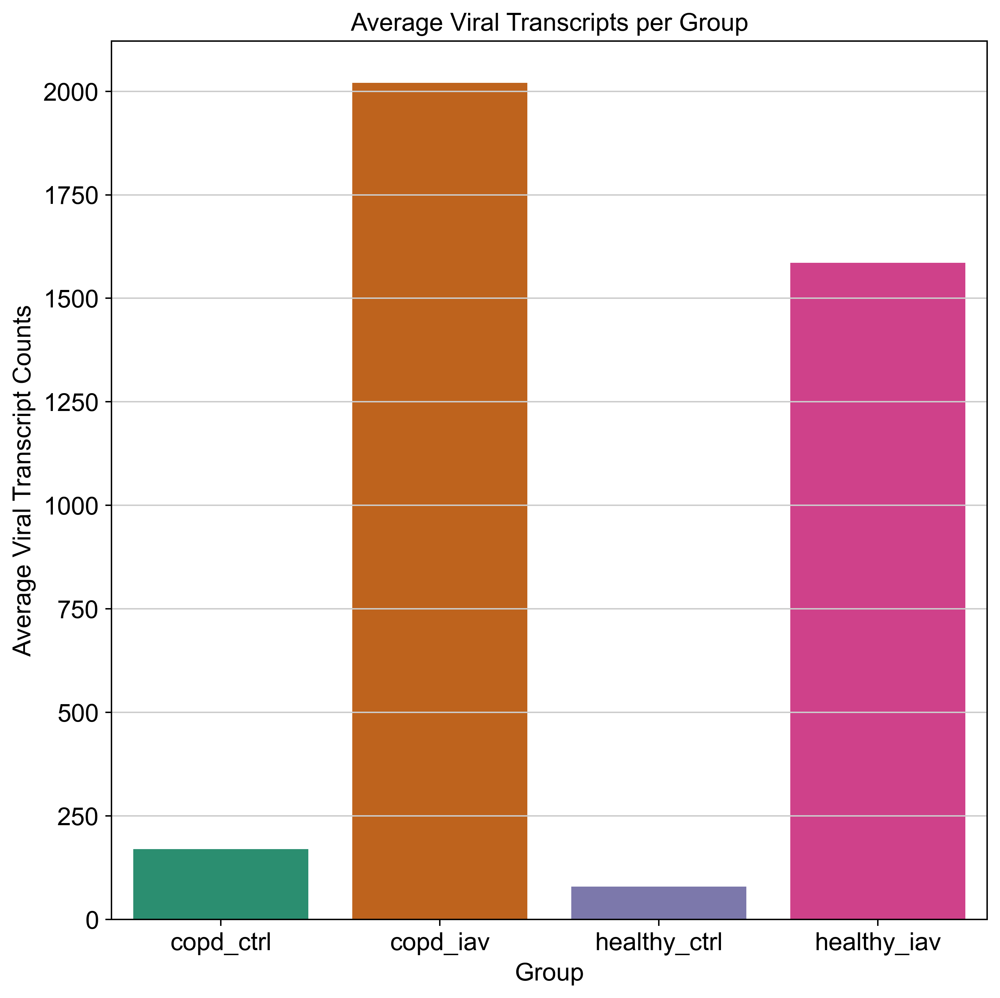

In [5]:
group_means = adata.obs.groupby('group')['viral_counts'].mean()

plt.figure(figsize = (8, 8))
sns.barplot(x = group_means.index, y = group_means.values, palette = 'Dark2')

plt.xlabel('Group')
plt.ylabel('Average Viral Transcript Counts')
plt.title('Average Viral Transcripts per Group')
plt.tight_layout()
plt.show()

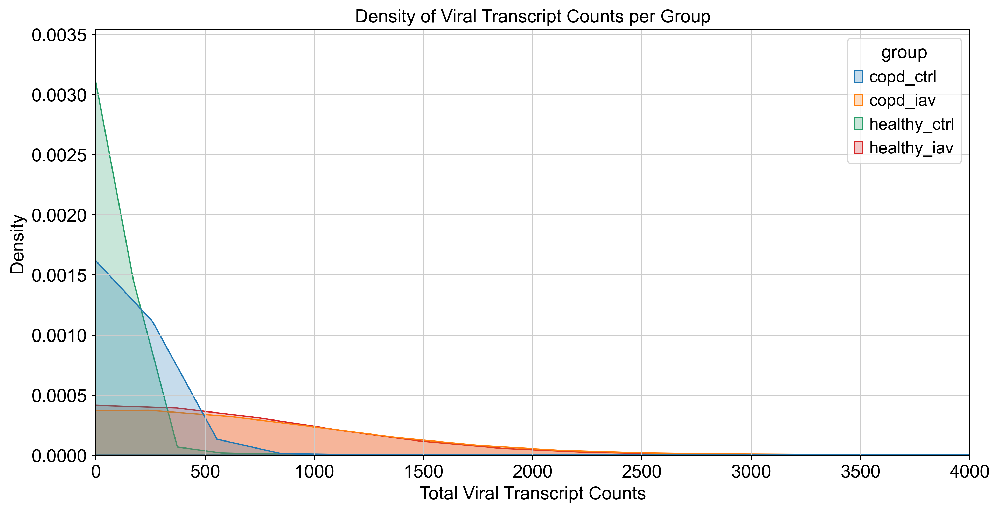

In [6]:
plt.figure(figsize = (12, 6))
sns.kdeplot(data = adata.obs, x = 'viral_counts', hue = 'group', common_norm = False, fill = True)
plt.title('Density of Viral Transcript Counts per Group')
plt.xlabel('Total Viral Transcript Counts')
plt.ylabel('Density')
plt.xlim(0, 4000)
plt.show()

### Subset uninfected cells and classify the three categories

In [7]:
adata_uninfected = adata[adata.obs['group'].isin(['healthy_ctrl', 'copd_ctrl'])] 
adata_uninfected

View of AnnData object with n_obs × n_vars = 49928 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status'
    var: 'mt', 'ribo'
    uns: 'cell_states_colors', 'disease_colors', 'group_colors', 'infected_status_colors', 'infection_colors'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

In [8]:
adata_infected = adata[~adata.obs['group'].isin(['healthy_ctrl', 'copd_ctrl'])]
adata_infected

View of AnnData object with n_obs × n_vars = 47645 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status'
    var: 'mt', 'ribo'
    uns: 'cell_states_colors', 'disease_colors', 'group_colors', 'infected_status_colors', 'infection_colors'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

### Identify cell categories in infected samples

In [9]:
adata_infected.obs['infected_status'] = adata_infected.obs['viral_counts'] > 1000
adata_infected.obs['infected_status'].value_counts()

/var/folders/j1/l8rz6t7953z7vlpdytk0pbv40000gn/T/ipykernel_13229/3779672311.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_infected.obs['infected_status'] = adata_infected.obs['viral_counts'] > 1000


infected_status
False    42756
True      4889
Name: count, dtype: int64

In [10]:
pd.crosstab(adata_infected.obs['infected_status'], adata_infected.obs['group'], dropna = False)

group,copd_iav,healthy_iav
infected_status,,
False,22018,20738
True,2940,1949


### Identify infection signature using a logistic regression model

In [11]:
X = adata_infected.X 
y = adata_infected.obs['infected_status']

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1712)

In [13]:
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [14]:
important_genes_indices = log_reg.coef_.argsort()[0][-200:]
important_genes = adata_infected.var_names[important_genes_indices]
important_genes

Index(['ERP29', 'HDAC2', 'RPL35', 'GPX3', 'NDUFA1', 'M6PR', 'IGFBP5',
       'AL031281.2', 'ADI1', 'SLIRP',
       ...
       'NC_026432.1', 'YWHAB', 'GDF15', 'NC_026436.1', 'RPS6', 'CP', 'CFL1',
       'TNFSF10', 'MT-ATP8', 'NC_026434.1'],
      dtype='object', length=200)

### Score learned signature in all cells

In [15]:
sc.tl.score_genes(adata_infected, gene_list = important_genes.tolist(), score_name = 'infection_signature_score')
pd.crosstab(adata_infected.obs['infection_signature_score'], adata_infected.obs['group'], dropna = False)

computing score 'infection_signature_score'
    finished: added
    'infection_signature_score', score of gene set (adata.obs).
    386 total control genes are used. (0:00:02)


group,copd_iav,healthy_iav
infection_signature_score,,
0.238472,1,0
0.240155,0,1
0.261166,0,1
0.314145,0,1
0.354197,0,1
...,...,...
338.785078,1,0
340.602332,0,1
346.440052,0,1


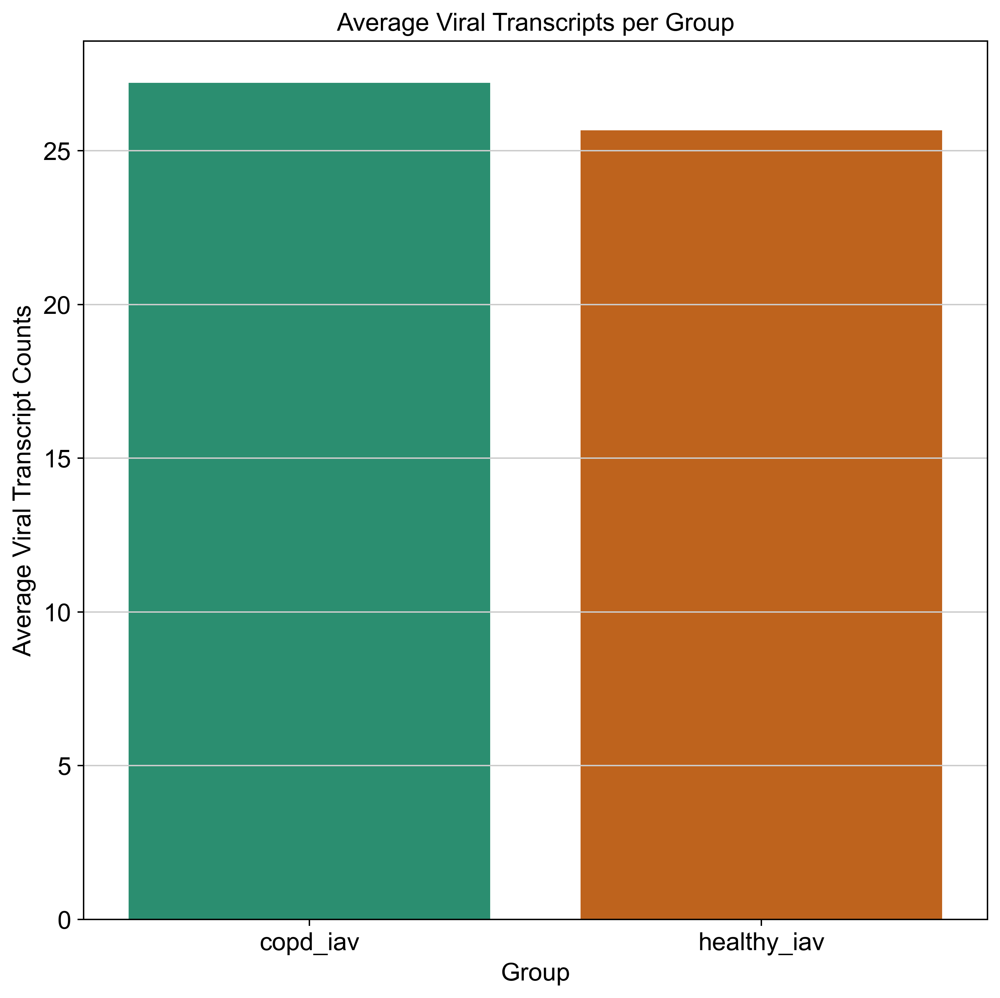

In [16]:
group_means = adata_infected.obs.groupby('group')['infection_signature_score'].mean()

plt.figure(figsize = (8, 8))
sns.barplot(x = group_means.index, y = group_means.values, palette = 'Dark2')

plt.xlabel('Group')
plt.ylabel('Average Viral Transcript Counts')
plt.title('Average Viral Transcripts per Group')
plt.tight_layout()
plt.show()

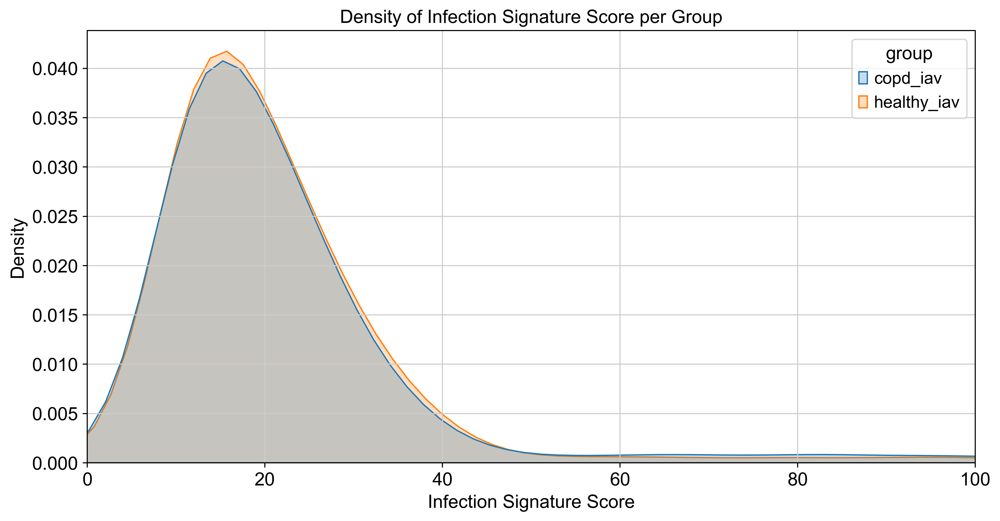

In [17]:
plt.figure(figsize = (12, 6))
sns.kdeplot(data = adata_infected.obs, x = 'infection_signature_score', hue = 'group', common_norm = False, fill = True)
plt.title('Density of Infection Signature Score per Group')
plt.xlabel('Infection Signature Score')
plt.ylabel('Density')
plt.xlim(0, 100)
plt.show()

### Categorise cells based on viral counts and signature score

In [18]:
def classify_cells(row):
    if row['viral_counts'] > 300 and row['infection_signature_score'] > threshold_high:
        return 'Infected'
    elif row['viral_counts'] < 300 and row['infection_signature_score'] > threshold_high:
        return 'Bystander'
    elif row['viral_counts'] < 200 and row['infection_signature_score'] <= threshold_low:
        return 'Uninfected'
    else:
        return 'Bystander'

In [19]:
threshold_high = 100
threshold_low = 25
adata_infected.obs['final_classification'] = adata_infected.obs.apply(classify_cells, axis = 1)
pd.crosstab(adata_infected.obs['final_classification'], adata_infected.obs['group'], dropna = False)

group,copd_iav,healthy_iav
final_classification,,
Bystander,7291,6571
Infected,1100,768
Uninfected,16567,15348


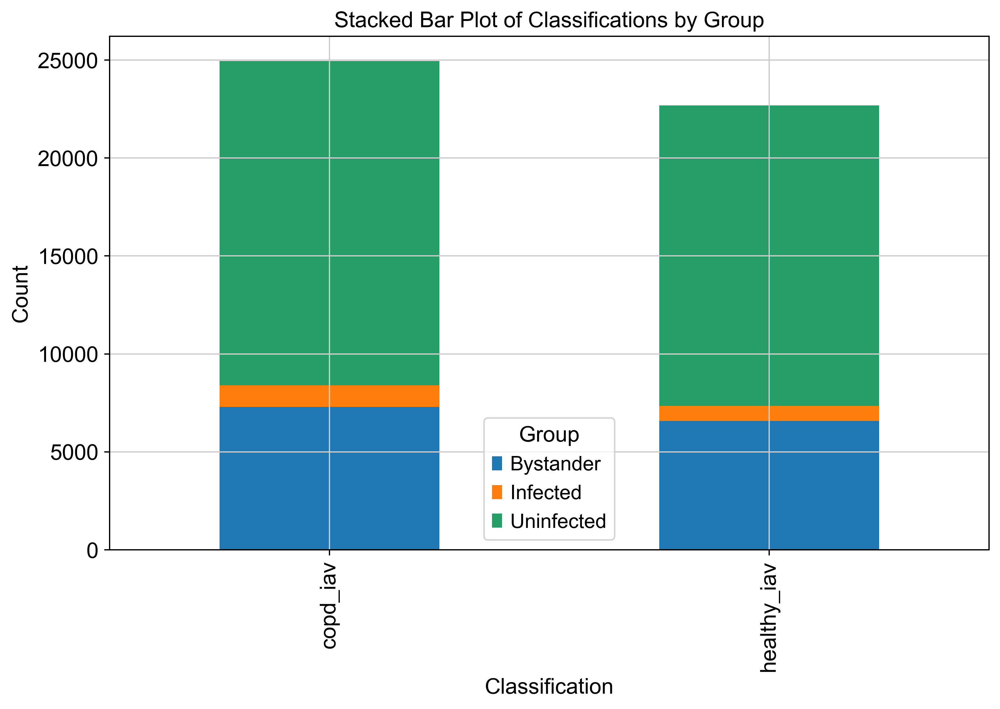

In [20]:
crosstab_df = pd.crosstab(adata_infected.obs['group'], adata_infected.obs['final_classification'], dropna = False)

crosstab_df.plot(kind = 'bar', stacked = True, figsize = (10, 6))
plt.title('Stacked Bar Plot of Classifications by Group')
plt.xlabel('Classification')
plt.ylabel('Count')
plt.legend(title='Group')
plt.show()

### Merge and clean up objects

In [21]:
adata_uninfected.obs['final_classification'] = 'Uninfected'
adata_uninfected

/var/folders/j1/l8rz6t7953z7vlpdytk0pbv40000gn/T/ipykernel_13229/2652372925.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_uninfected.obs['final_classification'] = 'Uninfected'


AnnData object with n_obs × n_vars = 49928 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status', 'final_classification'
    var: 'mt', 'ribo'
    uns: 'cell_states_colors', 'disease_colors', 'group_colors', 'infected_status_colors', 'infection_colors'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

In [22]:
adata_infected

AnnData object with n_obs × n_vars = 47645 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status', 'infection_signature_score', 'final_classification'
    var: 'mt', 'ribo'
    uns: 'cell_states_colors', 'disease_colors', 'group_colors', 'infected_status_colors', 'infection_colors'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

In [28]:
adata_new = adata_uninfected.concatenate(adata_infected, batch_key = 'scored_infection' , batch_categories = ['uninfected', 'infected'], join = 'inner')
adata_new

/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status', 'final_classification', 'infection_signature_score', 'scored_infection'
    var: 'mt', 'ribo'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

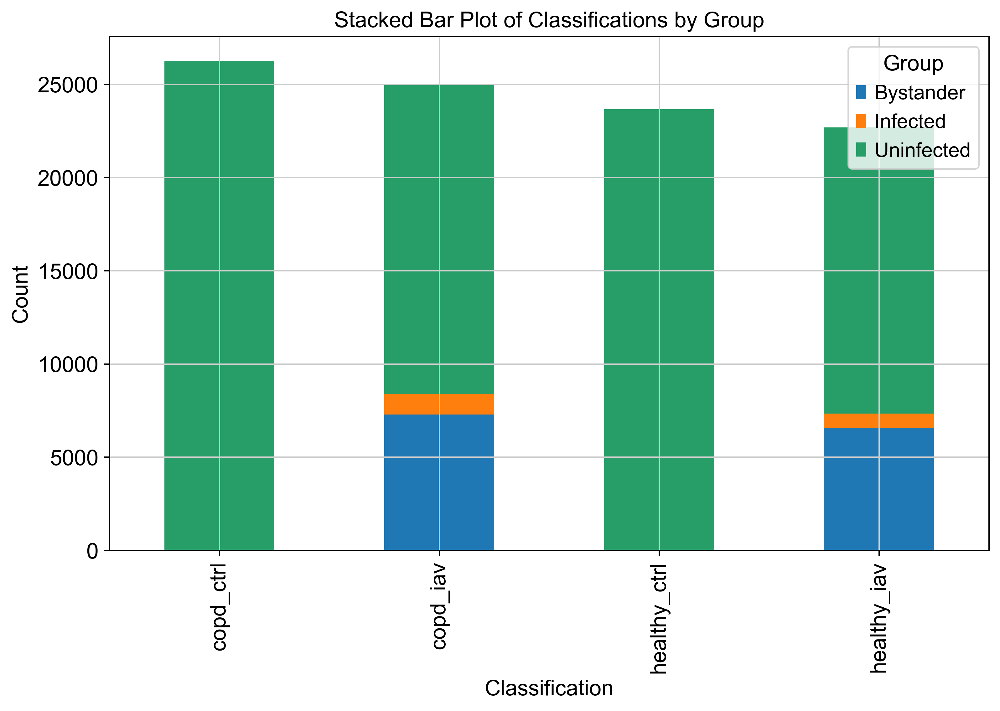

In [24]:
crosstab_df = pd.crosstab(adata_new.obs['group'], adata_new.obs['final_classification'], dropna = False)

crosstab_df.plot(kind = 'bar', stacked = True, figsize = (10, 6))
plt.title('Stacked Bar Plot of Classifications by Group')
plt.xlabel('Classification')
plt.ylabel('Count')
plt.legend(title='Group')
plt.show()

In [29]:
adata_new

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status', 'final_classification', 'infection_signature_score', 'scored_infection'
    var: 'mt', 'ribo'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

In [30]:
del(adata_new.obs['infected_status'])
adata_new.obs['infected_status'] = adata_new.obs['final_classification'].copy()

In [31]:
del(adata_new.obs['scored_infection'])
#del(adata_new.obs['infection_signature_score'])
del(adata_new.obs['final_classification'])
#del(adata_new.obs['seed_labels'])
adata_new

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infection_signature_score', 'infected_status'
    var: 'mt', 'ribo'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

In [32]:
adata_new

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infection_signature_score', 'infected_status'
    var: 'mt', 'ribo'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

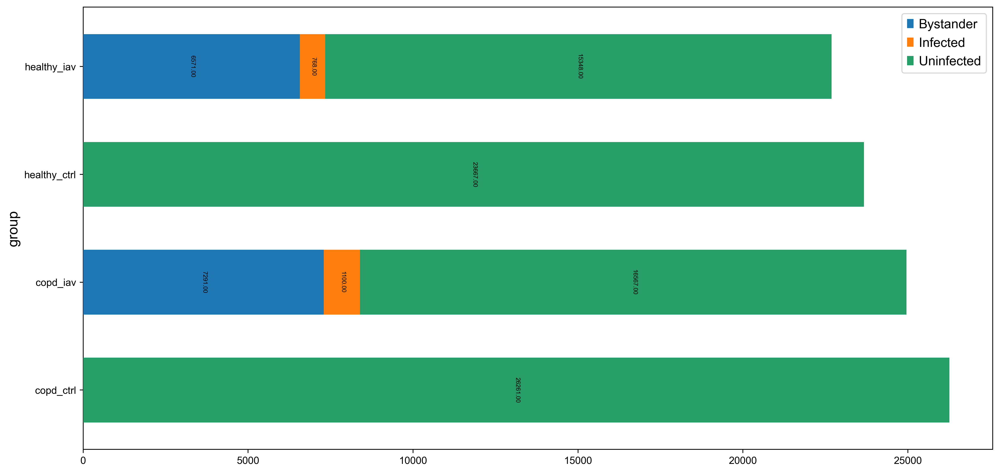

In [33]:
data = pd.crosstab(adata_new.obs['group'], adata_new.obs['infected_status'])

ax1 = data.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (16,8), fontsize = 10, grid = False, width = 0.6)
horiz_offset = 1.0
vert_offset = 1.0
ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset), ncol = 1)

for c in ax1.containers:
    
    labels = [f'{w:0.2f}' if (w := v.get_width()) > 0 else '' for v in c]
    ax1.bar_label(c, labels = labels, label_type = 'center', padding = 1, color = 'black', rotation = 270, fontsize = 6)

/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No d

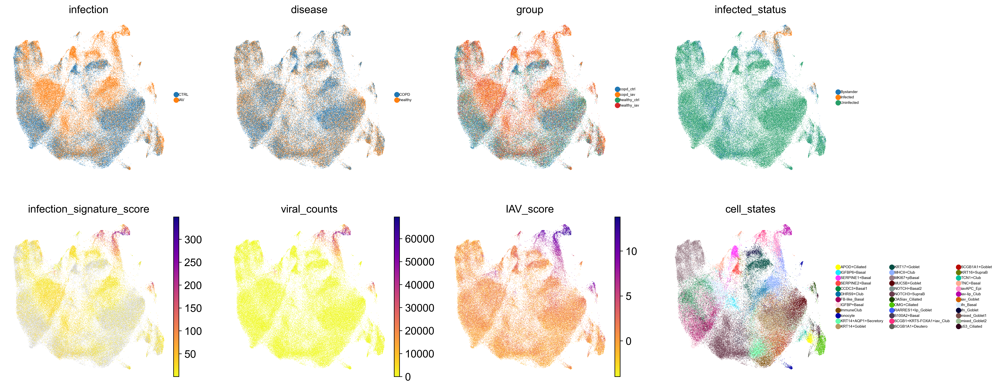

In [38]:
sc.pl.umap(adata_new, color = ['infection', 'disease', 'group', 'infected_status', 'infection_signature_score', 'viral_counts', 'IAV_score', 'cell_states'], frameon = False, legend_fontsize = 5, size = 0.8, cmap = 'plasma_r')

In [ ]:
sc.pl.umap(adata_new, color = ['infected_status'], groups = ['Bystander'], frameon = False, legend_fontsize = 5, size = 0.8 )

In [ ]:
sc.pl.umap(adata_new, color = ['infected_status'], groups = ['Infected'], frameon = False, legend_fontsize = 5, size = 0.8 )

### Export object